# Visualization of the currentscapes

In [2]:
from concurrent.futures import ProcessPoolExecutor
import glob
import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import altair as alt

from scipy import interpolate
from scipy.ndimage import uniform_filter1d, gaussian_filter1d
from currentscape_visualization.utils import *
# import altair_saver
alt.data_transformers.enable("vegafusion")

DataTransformerRegistry.enable('vegafusion')

In [3]:
## we need this to make sure that the files are read in the correct order...
## glob.glob file list are not necessarily ordered, and sort does not order them in the right way.
## we need to use a human sorting or natural soring http://nedbatchelder.com/blog/200712/human_sorting.html

import re

def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
    http://nedbatchelder.com/blog/200712/human_sorting.html
    (See Toothy's implementation in the comments)
    '''
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]


def find_csb_start(csb, sp_t, dt=0.2):
## detecting complex spike bursts
    # 1. find the spike closest after the csb
    ii = np.flatnonzero((sp_t - csb)>0)[0]
    allspikes = []
    if ((sp_t[ii] - csb) < 20):
        allspikes.append(sp_t[ii])
        ## collect all spikes before within 20 ms of the start
        move = True
        while (move):
            if (ii>0):
                if ((sp_t[ii] - sp_t[ii-1]) < 20):
                    allspikes.append(sp_t[ii-1])
                    ii = ii - 1
                else :
                    move = False
            else :
                move = False
        start_time = np.min(allspikes)
        return start_time
    else:
        print('no spike found within 20 ms')
        return []


def find_isolated_spikes(sp_t, delta=30, Tmax=10000):
## detecting isolated spikes
## delta: isolation time in ms
    spt = np.hstack((0, sp_t, Tmax)) # ms
    isolated_spt = []
    for i in np.arange(1, len(spt)-1):
        if (((spt[i] - spt[i-1]) > delta) & ((spt[i+1] - spt[i]) > delta)):
            isolated_spt.append(spt[i])
    i_spt = np.array(isolated_spt)
    return i_spt

def read_combine_current_files(input_dir, current_type, fileprefix, unique_indices=None):

    ####################################################################
    ## reading and combining current share files 
    part_neg_list = []
    part_pos_list = []

    negfiles_names = input_dir + '/' + current_type + '/' + fileprefix + '_neg*'
    negfiles = glob.glob(negfiles_names)
    negfiles.sort(key=natural_keys)
    # print(negfiles)
    
    posfiles_names = input_dir + '/' + current_type + '/' + fileprefix + '_pos*'
    posfiles = glob.glob(posfiles_names)
    posfiles.sort(key=natural_keys)
    # print(posfiles)
    
    for negfile in negfiles:
        part_neg_list.append(pd.read_csv(negfile, header=0, index_col=0))
    part_neg = pd.concat(part_neg_list, axis=1, ignore_index=True)
    
    for posfile in posfiles:
        part_pos_list.append(pd.read_csv(posfile, header=0, index_col=0))
    part_pos = pd.concat(part_pos_list, axis=1, ignore_index=True)

    if unique_indices is not None:
        part_neg_unique = part_neg.iloc[:, unique_indices]
        part_pos_unique = part_pos.iloc[:, unique_indices]
        return [part_neg_unique, part_pos_unique]
    else:
        return [part_neg, part_pos]
        
def plot_currentscape(part_pos, part_neg, vm, taxis, tmin, tmax, filename, return_segs=False, segments_preselected=True, 
                      vmin=-70, vmax=50, partitionby='type'):
    if (segments_preselected):
        part_pos_seg = part_pos
        part_neg_seg = part_neg
        t_seg = taxis
        vm_seg = vm
    else:        
        segment_indexes = np.flatnonzero((taxis > tmin) & (taxis < tmax))    
        part_pos_seg = part_pos.iloc[:, segment_indexes]
        part_neg_seg = part_neg.iloc[:, segment_indexes]
        t_seg = taxis[segment_indexes]
        vm_seg = vm[segment_indexes]

    # Create charts
    totalpos = create_currsum_pos_chart(part_pos_seg, t_seg)
    currshares_pos, currshares_neg = create_currshares_chart(part_pos_seg, part_neg_seg, t_seg, partitionby)
    vm_chart = create_vm_chart(vm_seg, t_seg, vmin, vmax)
    
    # Create currentscape
    currentscape = combine_charts(vm_chart, totalpos, currshares_pos, currshares_neg)
    currentscape.save(filename)
    if (return_segs):
        return [part_neg_seg, part_pos_seg, vm_seg]


def plot_currentscape_ave(perc_pos, perc_neg, part_pos, vm, taxis, tmin, tmax, filename, return_segs=False, 
                      vmin=-70, vmax=50, partitionby='type'):
## part_pos and part_neg are percentages, 
## the total current is calculated separately 
    
    segment_indexes = np.flatnonzero((taxis >= tmin) & (taxis <= tmax))    
    part_pos_seg = part_pos.iloc[:, segment_indexes]
    perc_pos_seg = perc_pos.iloc[:, segment_indexes]
    perc_neg_seg = perc_neg.iloc[:, segment_indexes]
    t_seg = taxis[segment_indexes]
    vm_seg = vm[segment_indexes]

    # Create charts
    totalpos = create_currsum_pos_chart(part_pos_seg, t_seg)
    currshares_pos, currshares_neg = create_currshares_chart(perc_pos_seg, perc_neg_seg, t_seg, partitionby)
    vm_chart = create_vm_chart(vm_seg, t_seg, vmin, vmax)
    
    # Create currentscape
    currentscape = combine_charts(vm_chart, totalpos, currshares_pos, currshares_neg)
    currentscape.save(filename)
    if (return_segs):
        return [part_neg_seg, part_pos_seg, vm_seg]

####################################################
## Find the indices nearest to a set of selected timepoints
####################################################

def get_nearest_index(t_target, t_orig):
    ## t_target: selected timepoints (5kHz)
    ## t_orig: original time points - the index of which will be returned
    
    event_index = np.searchsorted(t_orig, t_target, side="left") 
    # check wether we need the one before or after...
    min_before = np.argmin(np.vstack((np.abs(t_orig[event_index] - t_target), np.abs(t_orig[event_index-1] - t_target))), axis=0)
    event_index_ret = event_index - min_before
    return event_index_ret

def plot_CS_percent_ave(part_pos_list, part_neg_list, vm_list, taxis, part_neg_seg, filename, vmin=-70, vmax=50, partitionby='type'):

    ########################################################
    ## back to numpy arrays from list

    nrows = part_pos_list[0].shape[0]
    ncols = part_pos_list[0].shape[1]
    arr_pos = np.zeros((nrows, ncols, len(part_pos_list)))
    arr_neg = np.zeros((nrows, ncols, len(part_pos_list)))
    
    for i in range(len(part_pos_list)):
        arr_pos[:,:,i] = part_pos_list[i]
        arr_neg[:,:,i] = part_neg_list[i]
  
    arr_Vm = np.array(vm_list)
    
    ######################################################
    ## averaging - total current
    ######################################################
    ave_pos = pd.DataFrame(np.mean(arr_pos, axis=2), index=part_neg_seg.index)

    ######################################################
    ## normalizing the current contributions in each event
    ######################################################
    arr_pos_perc = arr_pos.copy()
    arr_neg_perc = arr_neg.copy()

    for i in range(arr_pos.shape[2]):
        arr_pos_perc[:,:,i] = arr_pos[:,:,i] / np.sum(arr_pos[:,:,i], axis=0)
    for i in range(arr_neg.shape[2]):
        arr_neg_perc[:,:,i] = -1 * arr_neg[:,:,i] / np.sum(arr_neg[:,:,i], axis=0)

    ave_pos_perc = pd.DataFrame(np.mean(arr_pos_perc, axis=2), index=part_neg_seg.index)
    ave_neg_perc = pd.DataFrame(np.mean(arr_neg_perc, axis=2), index=part_neg_seg.index)

    ######################################################
    ## normalizing the current contributions in each event
    ######################################################

    plot_currentscape_ave(ave_pos_perc, ave_neg_perc, ave_pos, np.mean(arr_Vm, axis=0), taxis, min(taxis), max(taxis), 
                          filename, return_segs=False, vmin=vmin, vmax=vmax, partitionby=partitionby)


# 1. Loading the partitioning of a single experiment

In [9]:
import pickle

fname = 'together_noca_280_480'
nsyn = 8

target = 'soma'
input_dir = f'L:/branch108/correct_time/{fname}'
preprocessed_dir = os.path.join(input_dir, 'preprocessed')
partitioned_dir = os.path.join(input_dir, 'results')

part_type_neg = os.path.join(partitioned_dir, f'neg_{nsyn}.csv')
part_type_pos = os.path.join(partitioned_dir, f'pos_{nsyn}.csv')

part_pos = pd.read_csv(part_type_pos, index_col=0)
part_neg = pd.read_csv(part_type_neg, index_col=0)
taxis = np.load(os.path.join(partitioned_dir, f'taxis_{nsyn}.npy'))[:part_pos.shape[1]]

with open(f'L:/branch108/correct_time/{fname}.pkl', 'rb') as f:
    sim_data = pickle.load(f)
v_idx = np.where(np.array(sim_data[0]['membrane_potential_data'][0]).astype(str) == f'{target}(0.5)')
v_target = np.array(sim_data[0]['membrane_potential_data'][1])[v_idx].squeeze()

tmin = 280
tmax = 380
filename = f'{fname}_{nsyn}.pdf'
partitionby = 'type'

In [14]:
plot_currentscape(part_pos, part_neg, v_target, taxis, tmin, tmax, filename, return_segs=False, segments_preselected=False, partitionby=partitionby)


KeyboardInterrupt



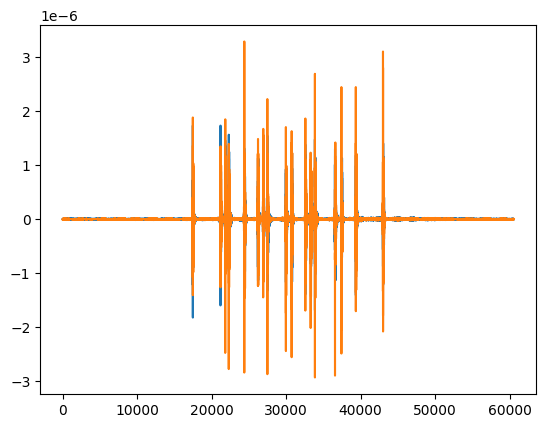

In [35]:
f, ax = plt.subplots()
ax.plot(np.sum(part_type_neg, axis=0) - np.sum(part_region_neg, axis=0))
ax.plot(np.sum(part_type_pos, axis=0)  - np.sum(part_region_pos, axis=0))

In [13]:
part_region_neg.iloc[:,28223:28230]

,28223,28224,28225,28226,28227,28228,28229
itype,,,,,,,
oblique_trunk_intrinsic,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
oblique_trunk_synaptic,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
axon_intrinsic,-0.001157,-0.001254,-0.001350,-0.001398,-0.001591,-0.001736,-0.001736
axon_synaptic,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
basal_intrinsic,-0.018524,-0.018524,-0.018496,-0.018447,-0.018308,-0.018170,-0.018170
basal_synaptic,-0.126959,-0.125659,-0.124404,-0.123168,-0.120950,-0.119312,-0.119312
distal_intrinsic,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
distal_synaptic,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
soma_synaptic,-0.000037,-0.000038,-0.000038,-0.000038,-0.000038,-0.000038,-0.000038


# 2. target: dendrites

1 kHz partitioning - selected points around theta, spikes and bursts 

In [25]:
## just checking that the region and type specific partitioning gives the same total current..

i_seed = 30
i_sim = 0
input_dir = '/Volumes/LaCie/FBence/CA1_PFs/varying_clocs_input/sim_clocs' + str(i_seed) + '_input' + str(i_sim)

target = 'dend5_0111111111111111111' # 18x1 non-terminal tuft branch, L=103 um
# target = 'dend5_011111111111111110' # 16x1 the other non-terminal tuft branch, L=105 um
# target = 'dend5_0111111111' # (9x1) trunk section, halfway between soma and tuft, L=21 um
# target = 'dend5_0111111111111' # (12x1) trunk section, halfway between soma and tuft, L=34um
partitionby = 'type'

negfile = input_dir + '/partitioned_' + target + '/partitioned_' + partitionby + '/im_neg_thetaSpikeBurst.csv'
posfile = input_dir + '/partitioned_' + target + '/partitioned_' + partitionby + '/im_pos_thetaSpikeBurst.csv'
part_type_neg = pd.read_csv(negfile, header=0, index_col=0)
part_type_pos = pd.read_csv(posfile, header=0, index_col=0)

partitionby = 'region'
negfile_reg = input_dir + '/partitioned_' + target + '/partitioned_' + partitionby + '/im_neg_thetaSpikeBurst.csv'
posfile_reg = input_dir + '/partitioned_' + target + '/partitioned_' + partitionby + '/im_pos_thetaSpikeBurst.csv'
part_region_neg = pd.read_csv(negfile_reg, header=0, index_col=0)
part_region_pos = pd.read_csv(posfile_reg, header=0, index_col=0)

f, ax = plt.subplots()
ax.scatter(np.sum(part_region_neg, axis=0), np.sum(part_type_neg, axis=0))
ax.scatter(np.sum(part_region_pos, axis=0), np.sum(part_type_pos, axis=0))

In [4]:
target = 'dend5_0111111111111' #'dend5_0111111111111111111', 'dend5_0111111111111'
partitionby = 'region' # 'type', 'region'
seeds = np.arange(30, 46)

vm_csb_list = []
vm_sspike_list = []
vm_theta_list = []

part_pos_csb_list = []
part_pos_sspike_list = []
part_pos_theta_list = []
part_neg_csb_list = []
part_neg_sspike_list = []
part_neg_theta_list = []

for i_sim, i_seed in enumerate(seeds):
    print(i_seed)
# i_seed = 30
# i_sim = 0
    input_dir = '/Volumes/LaCie/FBence/CA1_PFs/varying_clocs_input/sim_clocs' + str(i_seed) + '_input' + str(i_sim)
    
    negfile = input_dir + '/partitioned_' + target + '/partitioned_' + partitionby + '/im_neg_thetaSpikeBurst.csv'
    posfile = input_dir + '/partitioned_' + target + '/partitioned_' + partitionby + '/im_pos_thetaSpikeBurst.csv'
    partitioned_Im_neg = pd.read_csv(negfile, header=0, index_col=0)
    partitioned_Im_pos = pd.read_csv(posfile, header=0, index_col=0)
    
    ##################################################################
    ## load the time and voltage files
    ###################################################################################
    
    input_dir = '/Volumes/LaCie/FBence/CA1_PFs/varying_clocs_input/sim_clocs' + str(i_seed) + '_input' + str(i_sim)
    tfile = glob.glob(input_dir + '/processed_axial_currents/taxis*.npy')[0]
    taxis_nonunique = np.load(tfile)
    unique_indices = np.unique(taxis_nonunique, return_index=True)[1]
    taxis = taxis_nonunique[unique_indices]
    
    ## only a subset of the data were partitioned. To get the voltage indices right, we need to read the original taxis file as well
    alltfile = glob.glob(input_dir + '/taxis.npy')[0]
    allt = np.load(alltfile)
    imin = np.flatnonzero(allt>=taxis[0])[0] # start and end index of the partitioned data
    imax = np.flatnonzero(allt<=taxis[-1])[-1]
    
    ## load (and save) the target Vm and the soma Vm (detecting bursts and iSPs)
    somafilename = input_dir + '/membrane_potential_data/vsoma.npy'
    somafile = glob.glob(somafilename)
    if (len(somafile) == 0):
        vs = np.load(input_dir + '/membrane_potential_data/v.npy')[1471, :]  # 1471 soma(0.5)
        np.save(somafilename, vs)

    targetfilename = input_dir + '/membrane_potential_data/v' + target + '.npy'
    targetfile = glob.glob(targetfilename)
    if (len(targetfile) == 0):
        vs = np.load(input_dir + '/membrane_potential_data/v.npy')#[1471, :]  # 1471 soma(0.5)
    
        segnames = np.load(input_dir + '/membrane_potential_data/segments.npy')
        target_index = []
        target_string = target + '('
        for iseg in range(len(segnames)):
            if (segnames[iseg].startswith(target_string)):
                target_index.append(iseg)
        target_index
        i_target = target_index[len(target_index) // 2]    
    
        np.save(targetfilename, vs[i_target,:])
    
    vt = np.load(targetfilename)
    vtarget_nonunique = vt[imin:(imax+1)]
    vtarget = vtarget_nonunique[unique_indices]

    vs = np.load(somafilename)
    vsoma_nonunique = vs[imin:(imax+1)]
    vsoma = vsoma_nonunique[unique_indices]

    
    ##################################################################
    ## detect spikes, isolated spikes and CSBs, plot Vm
    #####################################################
    
    ## 5kHz resampling for spike and burst detection
    t5k = np.arange(min(taxis), max(taxis)+0.2, 0.2) # 5000 Hz
    FVm = interpolate.interp1d(taxis, vsoma, fill_value="extrapolate")
    vsoma5k = FVm(t5k)  

    ## burst and spike detection
    sp_idx = np.flatnonzero((vsoma5k[1:] > 0) & (vsoma5k[:(-1)]<0))
    sp_t = t5k[sp_idx]
    
    ## subthreshold Vm - 20 ms Gauss kernel
    subVm = gaussian_filter1d(vsoma5k, 100, mode='nearest')
    
    ## CSB detection: the somatic filtered Vm (20ms Gauss kernel) goes above -55 mV
    csb_idx = np.flatnonzero((subVm[1:] > -55) & (subVm[:(-1)]<-55))
    csb_t = t5k[csb_idx]
    csb_time = [] ## the start of the CSB: the first spike in the burst, in the burst all spikes should be within 20 ms 
    for i, csb in enumerate(csb_t):
        csb_time.append(find_csb_start(csb, sp_t))
    
    ## find isolated spikes: spikes with no other spikes within 30 ms distance
    isp_time = find_isolated_spikes(sp_t, delta=30)
    
    ## theta: 125 ms long
    ## we need 2 theta cycles without spike, near the PF center
    no_spike_theta = np.setdiff1d(np.arange(3000//250, 6000//250), np.unique(sp_t // 250))
    no_spike_mid_theta = no_spike_theta[np.argsort(np.abs(no_spike_theta - (4500//250)))][:2] # theta cycles with no spikes near the middle of the PF
    theta_time = no_spike_mid_theta * 250 # t -- t+250;    
    
    ## plot the VM response with the detected spikes and bursts
    # f, ax = plt.subplots(figsize=(10, 3))
    # ax.plot(taxis, vsoma)
    # ax.plot(t5k, subVm)
    # ax.vlines(isp_time, 50, 70, color='lime', label='sspike')
    # ax.vlines(csb_time, 50, 70, color='orange', label = 'burst')
    # ax.vlines(theta_time, 50, 70, color='purple', label = 'burst')
    # ax.legend()
    # ax.set(xlabel='time (s)', ylabel='voltage (mV)')
    # f.tight_layout()
    # filename = './Figures/Vmresps/Vm_' + str(i_seed) + '.png'
    # plt.savefig(filename)
    
    CSdir_burst = './Figures/Bursts/' + target
    CSdir_isp = './Figures/SSpikes/' + target
    CSdir_theta = './Figures/Theta/' + target
    os.makedirs(CSdir_burst, exist_ok=True)
    os.makedirs(CSdir_isp, exist_ok=True)
    os.makedirs(CSdir_theta, exist_ok=True)

    CSdir_burst = './Figures/Bursts/' + target + '/' + partitionby
    CSdir_isp = './Figures/SSpikes/' + target + '/' + partitionby
    CSdir_theta = './Figures/Theta/' + target + '/' + partitionby
    os.makedirs(CSdir_burst, exist_ok=True)
    os.makedirs(CSdir_isp, exist_ok=True)
    os.makedirs(CSdir_theta, exist_ok=True)

    # we have a set of desired datapoints csb_time, isp_time, theta_time
    for t_csb in csb_time:
        t5k_csb = np.arange(t_csb-20, t_csb+70, 0.2)
        burstindex = get_nearest_index(t5k_csb, taxis_nonunique)
        part_neg = partitioned_Im_neg.loc[:,list(burstindex.astype(str))]
        part_pos = partitioned_Im_pos.loc[:,list(burstindex.astype(str))]
        filename = CSdir_burst + '/CS_clocs' + str(i_seed) + '_t0' + str(int(t_csb)) + '.png'        
        part_neg_seg, part_pos_seg, vm_seg = plot_currentscape(part_pos, part_neg, vtarget_nonunique[burstindex], t5k_csb, 
                                                               t_csb-20, t_csb+70, filename, True, partitionby=partitionby)
        part_pos_csb_list.append(part_pos)
        part_neg_csb_list.append(part_neg)
        vm_csb_list.append(vtarget_nonunique[burstindex])
    
    t5k_isp = []
    for t_isp in isp_time:
        t5k_isp = np.arange(t_isp-20, t_isp+70, 0.2)
        ispindex = get_nearest_index(t5k_isp, taxis_nonunique)
        part_neg = partitioned_Im_neg.loc[:,list(ispindex.astype(str))]
        part_pos = partitioned_Im_pos.loc[:,list(ispindex.astype(str))]
        filename = CSdir_isp + '/CS_clocs' + str(i_seed) + '_t0' + str(int(t_isp)) + '.png'        
        part_neg_seg, part_pos_seg, vm_seg = plot_currentscape(part_pos, part_neg, vtarget_nonunique[ispindex], t5k_isp, 
                                                               t_isp-20, t_isp+70, filename, True, partitionby=partitionby)
        part_pos_sspike_list.append(part_pos)
        part_neg_sspike_list.append(part_neg)
        vm_sspike_list.append(vtarget_nonunique[ispindex])
    
    for t_theta in theta_time:
        t5k_theta = np.arange(t_theta, t_theta+250, 0.2)
        thetaindex = get_nearest_index(t5k_theta, taxis_nonunique)
        part_neg = partitioned_Im_neg.loc[:,list(thetaindex.astype(str))]
        part_pos = partitioned_Im_pos.loc[:,list(thetaindex.astype(str))]
        filename = CSdir_theta + '/CS_clocs' + str(i_seed) + '_t0' + str(int(t_theta)) + '.png'        
        part_neg_seg, part_pos_seg, vm_seg = plot_currentscape(part_pos, part_neg, vtarget_nonunique[thetaindex], t5k_theta, 
                                                               t_theta-20, t_theta+70, filename, True, vmin=-70, vmax=-50, partitionby=partitionby)
        part_pos_theta_list.append(part_pos)
        part_neg_theta_list.append(part_neg)
        vm_theta_list.append(vtarget_nonunique[thetaindex])
    
        
## csb
taxis_csb = np.arange(-20, 70, 0.2)
filename = CSdir_burst + '/average_perc.pdf'
plot_CS_percent_ave(part_pos_csb_list, part_neg_csb_list, vm_csb_list, taxis_csb, part_neg_seg, filename, partitionby=partitionby)

## sspike
taxis_sspike = np.arange(-20, 70, 0.2)
filename = CSdir_isp + '/average_perc.pdf'
plot_CS_percent_ave(part_pos_sspike_list, part_neg_sspike_list, vm_sspike_list, taxis_sspike, part_neg_seg, filename, partitionby=partitionby)

## theta
taxis_theta = np.arange(0, 250, 0.2)
filename = CSdir_theta + '/average_perc.pdf'
plot_CS_percent_ave(part_pos_theta_list, part_neg_theta_list, vm_theta_list, taxis_theta, part_neg_seg, filename, vmin=-70, vmax=-50, partitionby=partitionby)


30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45


# 3. Target: soma

Plot all bursts and isolated spikes - in the clocs-stim simulations

In [6]:
target = 'soma'
partitionby = 'region' # 'type', 'region', 'total_currents', 'soma_currents'
seeds = np.arange(30, 46)

vm_csb_list = []
vm_sspike_list = []
vm_theta_list = []

part_pos_csb_list = []
part_pos_sspike_list = []
part_pos_theta_list = []
part_neg_csb_list = []
part_neg_sspike_list = []
part_neg_theta_list = []

for i_sim, i_seed in enumerate(seeds):
    print(i_seed)
# i_seed = 30
# i_sim = 0
    input_dir = '/Volumes/LaCie/FBence/CA1_PFs/varying_clocs_input/sim_clocs' + str(i_seed) + '_input' + str(i_sim)
    
    ##################################################################
    ## load the time and voltage files
    ###################################################################################
    
    input_dir = '/Volumes/LaCie/FBence/CA1_PFs/varying_clocs_input/sim_clocs' + str(i_seed) + '_input' + str(i_sim)
    tfile = glob.glob(input_dir + '/processed_axial_currents/taxis*.npy')[0]
    taxis_nonunique = np.load(tfile)
    unique_indices = np.unique(taxis_nonunique, return_index=True)[1]
    taxis = taxis_nonunique[unique_indices]
    
    ## only a subset of the data were partitioned. To get the voltage indices right, we need to read the original taxis file as well
    alltfile = glob.glob(input_dir + '/taxis.npy')[0]
    allt = np.load(alltfile)
    imin = np.flatnonzero(allt>=taxis[0])[0] # start and end index of the partitioned data
    imax = np.flatnonzero(allt<=taxis[-1])[-1]
    
    ## load (and save) the target Vm and the soma Vm (detecting bursts and iSPs)
    somafilename = input_dir + '/membrane_potential_data/vsoma.npy'
    somafile = glob.glob(somafilename)
    if (len(somafile) == 0):
        vs = np.load(input_dir + '/membrane_potential_data/v.npy')[1471, :]  # 1471 soma(0.5)
        np.save(somafilename, vs)

    targetfilename = input_dir + '/membrane_potential_data/v' + target + '.npy'
    targetfile = glob.glob(targetfilename)
    if (len(targetfile) == 0):
        vs = np.load(input_dir + '/membrane_potential_data/v.npy')#[1471, :]  # 1471 soma(0.5)
    
        segnames = np.load(input_dir + '/membrane_potential_data/segments.npy')
        target_index = []
        target_string = target + '('
        for iseg in range(len(segnames)):
            if (segnames[iseg].startswith(target_string)):
                target_index.append(iseg)
        target_index
        i_target = target_index[len(target_index) // 2]    
    
        np.save(targetfilename, vs[i_target,:])
    
    vt = np.load(targetfilename)
    vtarget_nonunique = vt[imin:(imax+1)]
    vtarget = vtarget_nonunique[unique_indices]

    vs = np.load(somafilename)
    vsoma_nonunique = vs[imin:(imax+1)]
    vsoma = vsoma_nonunique[unique_indices]

    
    ##################################################################
    ## detect spikes, isolated spikes and CSBs, plot Vm
    #####################################################
    
    ## 5kHz resampling for spike and burst detection
    t5k = np.arange(min(taxis), max(taxis)+0.2, 0.2) # 5000 Hz
    FVm = interpolate.interp1d(taxis, vsoma, fill_value="extrapolate")
    vsoma5k = FVm(t5k)  

    ## burst and spike detection
    sp_idx = np.flatnonzero((vsoma5k[1:] > 0) & (vsoma5k[:(-1)]<0))
    sp_t = t5k[sp_idx]
    
    ## subthreshold Vm - 20 ms Gauss kernel
    subVm = gaussian_filter1d(vsoma5k, 100, mode='nearest')
    
    ## CSB detection: the somatic filtered Vm (20ms Gauss kernel) goes above -55 mV
    csb_idx = np.flatnonzero((subVm[1:] > -55) & (subVm[:(-1)]<-55))
    csb_t = t5k[csb_idx]
    csb_time = [] ## the start of the CSB: the first spike in the burst, in the burst all spikes should be within 20 ms 
    for i, csb in enumerate(csb_t):
        csb_time.append(find_csb_start(csb, sp_t))
    
    ## find isolated spikes: spikes with no other spikes within 30 ms distance
    isp_time = find_isolated_spikes(sp_t, delta=30)
    
    ## theta: 125 ms long
    ## we need 2 theta cycles without spike, near the PF center
    no_spike_theta = np.setdiff1d(np.arange(3000//250, 6000//250), np.unique(sp_t // 250))
    no_spike_mid_theta = no_spike_theta[np.argsort(np.abs(no_spike_theta - (4500//250)))][:2] # theta cycles with no spikes near the middle of the PF
    theta_time = no_spike_mid_theta * 250 # t -- t+250;    
    
    # plot the VM response with the detected spikes and bursts
    # f, ax = plt.subplots(figsize=(10, 3))
    # ax.plot(taxis, vsoma)
    # ax.plot(t5k, subVm)
    # ax.vlines(isp_time, 50, 70, color='lime', label='sspike')
    # ax.vlines(csb_time, 50, 70, color='orange', label = 'burst')
    # ax.vlines(theta_time, 50, 70, color='purple', label = 'theta')
    # ax.legend()
    # ax.set(xlabel='time (s)', ylabel='voltage (mV)')
    # f.tight_layout()
    # filename = './Figures/Vmresps/Vm_' + str(i_seed) + '.png'
    # plt.savefig(filename)

    #####################################################
    ## read the current chunk files
    #####################################################
    partition_dir = input_dir + '/partitioned_' + target
    part_neg_all, part_pos_all = read_combine_current_files(partition_dir, partitionby, '*')
    
    CSdir_burst = './Figures/Bursts/' + target
    CSdir_isp = './Figures/SSpikes/' + target
    CSdir_theta = './Figures/Theta/' + target
    os.makedirs(CSdir_burst, exist_ok=True)
    os.makedirs(CSdir_isp, exist_ok=True)
    os.makedirs(CSdir_theta, exist_ok=True)

    CSdir_burst = './Figures/Bursts/' + target + '/' + partitionby
    CSdir_isp = './Figures/SSpikes/' + target + '/' + partitionby
    CSdir_theta = './Figures/Theta/' + target + '/' + partitionby
    os.makedirs(CSdir_burst, exist_ok=True)
    os.makedirs(CSdir_isp, exist_ok=True)
    os.makedirs(CSdir_theta, exist_ok=True)

    #####################################################
    ## Bursts
    #####################################################

    # we have a set of desired datapoints csb_time, isp_time, theta_time
    if (len(csb_time) > 0):
        for t_csb in csb_time:
            if ((t_csb > 3020) & (t_csb < 5900)):
                t5k_csb = np.arange(t_csb-20, t_csb+70, 0.2)
                burstindex = get_nearest_index(t5k_csb, taxis_nonunique)
                part_neg = part_neg_all.loc[:,list(burstindex)]
                part_pos = part_pos_all.loc[:,list(burstindex)]
                filename = CSdir_burst + '/CS_clocs' + str(i_seed) + '_t0' + str(int(t_csb)) + '.png'
                print(filename)
                part_neg_seg, part_pos_seg, vm_seg = plot_currentscape(part_pos, part_neg, vtarget_nonunique[burstindex], t5k_csb, 
                                                                       t_csb-20, t_csb+70, filename, True, partitionby=partitionby)
                part_pos_csb_list.append(part_pos)
                part_neg_csb_list.append(part_neg)
                vm_csb_list.append(vtarget_nonunique[burstindex])
    
 
    #####################################################
    ## Spikes
    #####################################################
    if (len(isp_time) > 0):
        for t_isp in isp_time:
            if ((t_isp > 3020) & (t_isp < 5900)):
                t5k_isp = np.arange(t_isp-20, t_isp+70, 0.2)
                ispindex = get_nearest_index(t5k_isp, taxis_nonunique)
                part_neg = part_neg_all.loc[:,list(ispindex)]
                part_pos = part_pos_all.loc[:,list(ispindex)]
                filename = CSdir_isp + '/CS_clocs' + str(i_seed) + '_t0' + str(int(t_isp)) + '.png'        
                print(filename)
                part_neg_seg, part_pos_seg, vm_seg = plot_currentscape(part_pos, part_neg, vtarget_nonunique[ispindex], t5k_isp, 
                                                                       t_isp-20, t_isp+70, filename, True, partitionby=partitionby)
                part_pos_sspike_list.append(part_pos)
                part_neg_sspike_list.append(part_neg)
                vm_sspike_list.append(vtarget_nonunique[ispindex])
    

    #####################################################
    ## Thetas
    #####################################################
    if (len(theta_time) > 0):
        for t_theta in theta_time:
            if ((t_theta > 3000) & (t_theta < 5800)):
                t5k_theta = np.arange(t_theta, t_theta+250, 0.2)
                thetaindex = get_nearest_index(t5k_theta, taxis_nonunique)
                part_neg = part_neg_all.loc[:,list(thetaindex)]
                part_pos = part_pos_all.loc[:,list(thetaindex)]
                filename = CSdir_theta + '/CS_clocs' + str(i_seed) + '_t0' + str(int(t_theta)) + '.png'        
                print(filename)
                # def plot_currentscape(part_pos, part_neg, vm, taxis, tmin, tmax, filename, return_segs=False, segments_preselected=True, 
                #           vmin=-70, vmax=50, partitionby='type'):
                part_neg_seg, part_pos_seg, vm_seg = plot_currentscape(part_pos, part_neg, vtarget_nonunique[thetaindex], t5k_theta, 
                                                                       t_theta, t_theta+250, filename, True, vmin=-70, vmax=-50, partitionby=partitionby)
                part_pos_theta_list.append(part_pos)
                part_neg_theta_list.append(part_neg)
                vm_theta_list.append(vtarget_nonunique[thetaindex])
    
        
## csb
taxis_csb = np.arange(-20, 70, 0.2)
filename = CSdir_burst + '/average_perc.pdf'
plot_CS_percent_ave(part_pos_csb_list, part_neg_csb_list, vm_csb_list, taxis_csb, part_neg_seg, filename, partitionby=partitionby)

## sspike
taxis_sspike = np.arange(-20, 70, 0.2)
filename = CSdir_isp + '/average_perc.pdf'
plot_CS_percent_ave(part_pos_sspike_list, part_neg_sspike_list, vm_sspike_list, taxis_sspike, part_neg_seg, filename, partitionby=partitionby)

## theta
taxis_theta = np.arange(0, 250, 0.2)
filename = CSdir_theta + '/average_perc.pdf'
plot_CS_percent_ave(part_pos_theta_list, part_neg_theta_list, vm_theta_list, taxis_theta, part_neg_seg, filename, vmin=-70, vmax=-50, partitionby=partitionby)


30
./Figures/Bursts/soma/region/CS_clocs30_t04161.png
./Figures/Bursts/soma/region/CS_clocs30_t04375.png
./Figures/Bursts/soma/region/CS_clocs30_t04623.png
./Figures/SSpikes/soma/region/CS_clocs30_t03975.png
./Figures/SSpikes/soma/region/CS_clocs30_t04286.png
./Figures/SSpikes/soma/region/CS_clocs30_t04889.png
./Figures/SSpikes/soma/region/CS_clocs30_t05047.png
./Figures/Theta/soma/region/CS_clocs30_t05250.png
./Figures/Theta/soma/region/CS_clocs30_t03500.png
31
./Figures/Bursts/soma/region/CS_clocs31_t03927.png
./Figures/SSpikes/soma/region/CS_clocs31_t04173.png
./Figures/SSpikes/soma/region/CS_clocs31_t04280.png
./Figures/SSpikes/soma/region/CS_clocs31_t04411.png
./Figures/SSpikes/soma/region/CS_clocs31_t04525.png
./Figures/SSpikes/soma/region/CS_clocs31_t04760.png
./Figures/SSpikes/soma/region/CS_clocs31_t04889.png
./Figures/SSpikes/soma/region/CS_clocs31_t05375.png
./Figures/Theta/soma/region/CS_clocs31_t05000.png
./Figures/Theta/soma/region/CS_clocs31_t03500.png
32
./Figures/Burst

# 4. The old simulation

varying_cluster_locations only, seed: 26

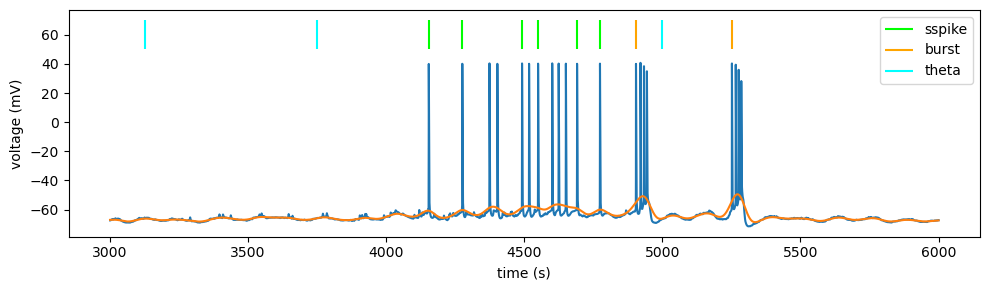

In [4]:
i_seed = 26
# target = 'dend5_0111111111111111111'
target = 'soma'
partitionby = 'total_currents' ## region, type, soma_currents, total_currents 


input_dir = '/Volumes/LaCie/FBence/CA1_PFs/varying_cluster_locations/varying_cluster_locations26'
tfile = glob.glob(input_dir + '/processed_axial_currents/taxis*.npy')[0]
taxis_nonunique = np.load(tfile)
unique_indices = np.unique(taxis_nonunique, return_index=True)[1]
taxis = taxis_nonunique[unique_indices]

## only a subset of the data were partitioned. To get the voltage indices right, we need to read the original txeis file as well
alltfile = glob.glob(input_dir + '/taxis.npy')[0]
allt = np.load(alltfile)
imin = np.flatnonzero(allt>=taxis[0])[0] # start and end index of the partitioned data
imax = np.flatnonzero(allt<=taxis[-1])[-1]

## load (and save) the somatic Vm
vfiles = glob.glob(input_dir + '/membrane_potential_data/vs*.npy')
if (len(vfiles) == 0):
    vs = np.load(input_dir + '/membrane_potential_data/v.npy')[1471, :]  # 1471 soma(0.5)
    np.save(input_dir + '/membrane_potential_data/vsoma.npy', vs)
vs = np.load(input_dir + '/membrane_potential_data/vsoma.npy')
vsoma_nonunique = vs[imin:(imax+1)]
vsoma = vsoma_nonunique[unique_indices]


targetfilename = input_dir + '/membrane_potential_data/v' + target + '.npy'
targetfile = glob.glob(targetfilename)
if (len(targetfile) == 0):
    vs = np.load(input_dir + '/membrane_potential_data/v.npy')#[1471, :]  # 1471 soma(0.5)

    segnames = np.load(input_dir + '/membrane_potential_data/segments.npy')
    target_index = []
    target_string = target + '('
    for iseg in range(len(segnames)):
        if (segnames[iseg].startswith(target_string)):
            target_index.append(iseg)
    target_index
    i_target = target_index[len(target_index) // 2]    

    np.save(targetfilename, vs[i_target,:])

vt = np.load(targetfilename)
vtarget_nonunique = vt[imin:(imax+1)]
vtarget = vtarget_nonunique[unique_indices]


##################################################################
## detect spikes, isolated spikes and CSBs, plot Vm
#####################################################

## 5kHz resampling for spike and burst detection
t5k = np.arange(min(taxis), max(taxis)+0.2, 0.2) # 5000 Hz
FVm = interpolate.interp1d(taxis, vsoma, fill_value="extrapolate")
vsoma5k = FVm(t5k)  

## burst and spike detection
sp_idx = np.flatnonzero((vsoma5k[1:] > 0) & (vsoma5k[:(-1)]<0))
sp_t = t5k[sp_idx]

## subthreshold Vm - 20 ms Gauss kernel
subVm = gaussian_filter1d(vsoma5k, 100, mode='nearest')

## CSB detection: the somatic filtered Vm (20ms Gauss kernel) goes above -55 mV
csb_idx = np.flatnonzero((subVm[1:] > -55) & (subVm[:(-1)]<-55))
csb_t = t5k[csb_idx]
csb_time = [] ## the start of the CSB: the first spike in the burst, in the burst all spikes should be within 20 ms 
for i, csb in enumerate(csb_t):
    csb_time.append(find_csb_start(csb, sp_t))

## find isolated spikes: spikes with no other spikes within 30 ms distance
isp_time = find_isolated_spikes(sp_t, delta=30)

## theta: 125 ms long
## we need 2 theta cycles without spike, near the PF center
no_spike_theta = np.setdiff1d(np.arange(3000//250, 6000//250), np.unique(sp_t // 250))
no_spike_mid_theta = no_spike_theta[np.argsort(np.abs(no_spike_theta - (4500//250)))][:2] # theta cycles with no spikes near the middle of the PF
theta_time = no_spike_mid_theta * 250 # t -- t+250;    

theta_time = np.hstack((theta_time, 3125))
isp_time = np.hstack((isp_time, 4491.6))


os.makedirs('../figures', exist_ok=True)
os.makedirs('./Figures/Vmresps/', exist_ok=True)

## plot the VM response with the detected spikes and bursts
f, ax = plt.subplots(figsize=(10, 3))
ax.plot(taxis, vsoma)
ax.plot(t5k, subVm)
ax.vlines(isp_time, 50, 70, color='lime', label='sspike')
ax.vlines(csb_time, 50, 70, color='orange', label = 'burst')
ax.vlines(theta_time, 50, 70, color='cyan', label = 'theta')
ax.legend()
ax.set(xlabel='time (s)', ylabel='voltage (mV)')
f.tight_layout()
filename = './Figures/Vmresps/Vm_' + str(i_seed) + '.png'
plt.savefig(filename)


#####################################################
## read the current chunk files
#####################################################
partition_dir = input_dir + '/partitioned_' + target
part_neg, part_pos = read_combine_current_files(partition_dir, partitionby, '*', unique_indices)


os.makedirs('./Figures/Bursts/', exist_ok=True)
os.makedirs('./Figures/SSpikes/', exist_ok=True)
os.makedirs('./Figures/Theta/', exist_ok=True)


#####################################################
## Bursts
#####################################################

os.makedirs('./Figures/Bursts/' + target, exist_ok=True)
os.makedirs('./Figures/Bursts/' + target + '/' + partitionby, exist_ok=True)

if (len(csb_time) > 0):
    for t_csb in csb_time:
        tmin = t_csb - 20
        tmax = t_csb + 70
        t5k_seg = np.arange(tmin, tmax, 0.2)

        filename = './Figures/Bursts/' + target + '/' + partitionby + '/CS_clocs' + str(i_seed) + '_t0' + str(int(tmin)) + '.png'        
        part_neg_seg, part_pos_seg, vm_seg = plot_currentscape(part_pos, part_neg, vtarget, taxis, tmin, tmax, 
                                                               filename, return_segs=True, segments_preselected=False, partitionby=partitionby)


#####################################################
## Thetas
#####################################################

os.makedirs('./Figures/Theta/' + target, exist_ok=True)
os.makedirs('./Figures/Theta/' + target + '/' + partitionby, exist_ok=True)

if (len(theta_time) > 0):
    for t_theta in theta_time:
        tmin = t_theta
        tmax = t_theta + 250
        t5k_seg = np.arange(tmin, tmax, 0.2)

        filename = './Figures/Theta/' + target + '/' + partitionby + '/CS_clocs' + str(i_seed) + '_t0' + str(int(tmin)) + '.png'        
        plot_currentscape(part_pos, part_neg, vtarget, taxis, tmin, tmax, filename, return_segs=False, segments_preselected=False, 
                          vmin=-70, vmax=-40, partitionby=partitionby)

#####################################################
## Isolated Spikes
#####################################################

os.makedirs('./Figures/SSpikes/' + target, exist_ok=True)
os.makedirs('./Figures/SSpikes/' + target + '/' + partitionby, exist_ok=True)

if (len(isp_time) > 0):
    for t_isp in isp_time:
        tmin = t_isp - 20
        tmax = t_isp + 70
        t5k_seg = np.arange(tmin, tmax, 0.2)
        
        filename = './Figures/SSpikes/' + target + '/' + partitionby + '/CS_clocs' + str(i_seed) + '_t0' + str(int(tmin)) + '.png'        
        plot_currentscape(part_pos, part_neg, vtarget, taxis, tmin, tmax, filename, 
                          return_segs=False, segments_preselected=False, partitionby=partitionby)


In [5]:
i_seed = 26
# target = 'dend5_0111111111111111111'
target = 'soma'
partitionby = 'total_currents' ## region, type, soma_currents, total_currents 
input_dir = '/Volumes/LaCie/FBence/CA1_PFs/varying_cluster_locations/varying_cluster_locations26'

tfile = glob.glob(input_dir + '/processed_axial_currents/taxis*.npy')[0]
taxis_nonunique = np.load(tfile)
unique_indices = np.unique(taxis_nonunique, return_index=True)[1]
taxis = taxis_nonunique[unique_indices]

## only a subset of the data were partitioned. To get the voltage indices right, we need to read the original txeis file as well
alltfile = glob.glob(input_dir + '/taxis.npy')[0]
allt = np.load(alltfile)
imin = np.flatnonzero(allt>=taxis[0])[0] # start and end index of the partitioned data
imax = np.flatnonzero(allt<=taxis[-1])[-1]

## load (and save) the somatic Vm
vfiles = glob.glob(input_dir + '/membrane_potential_data/vs*.npy')
if (len(vfiles) == 0):
    vs = np.load(input_dir + '/membrane_potential_data/v.npy')[1471, :]  # 1471 soma(0.5)
    np.save(input_dir + '/membrane_potential_data/vsoma.npy', vs)
vs = np.load(input_dir + '/membrane_potential_data/vsoma.npy')
vsoma_nonunique = vs[imin:(imax+1)]
vsoma = vsoma_nonunique[unique_indices]


targetfilename = input_dir + '/membrane_potential_data/v' + target + '.npy'
targetfile = glob.glob(targetfilename)
if (len(targetfile) == 0):
    vs = np.load(input_dir + '/membrane_potential_data/v.npy')#[1471, :]  # 1471 soma(0.5)

    segnames = np.load(input_dir + '/membrane_potential_data/segments.npy')
    target_index = []
    target_string = target + '('
    for iseg in range(len(segnames)):
        if (segnames[iseg].startswith(target_string)):
            target_index.append(iseg)
    target_index
    i_target = target_index[len(target_index) // 2]    

    np.save(targetfilename, vs[i_target,:])

vt = np.load(targetfilename)
vtarget_nonunique = vt[imin:(imax+1)]
vtarget = vtarget_nonunique[unique_indices]

#####################################################
## read the current chunk files
#####################################################
partition_dir = input_dir + '/partitioned_' + target
part_neg, part_pos = read_combine_current_files(partition_dir, partitionby, '*', unique_indices)

tmin = min(taxis)
tmax = max(taxis)

filename = './Figures/CS_' + partitionby + '_clocs' + str(i_seed) + '_t0' + str(int(tmin)) + '.png'        
plot_currentscape(part_pos, part_neg, vtarget, taxis, tmin, tmax, filename, return_segs=False, segments_preselected=False, 
                  partitionby=partitionby)


In [30]:
# import os

# soma_dir = input_dir + '/partitioned_soma/'
# dend_dir = input_dir + '/partitioned_dend5_0111111111111111111/'

# soma_folders = os.listdir(soma_dir)

# target_dir = soma_dir + soma_folders[0]
# all_files = os.listdir(target_dir)
# filename = all_files[0]

# extension = filename.split('.')[-1]
# namestring = filename.split('.')[0]

# 5. whole currentscapes

In [36]:
# # Rename current type column
# part_neg.rename(columns={part_neg.columns[0]: 'itype'}, inplace=True)
# part_pos.rename(columns={part_pos.columns[0]: 'itype'}, inplace=True)

# Identify unique indices based on the time vector t
# We should have done this right after the simulation...
unique_indices = np.unique(t, return_index=True)[1]

# Keep only the unique indices in t, v, part_pos, and part_neg
t_unique = t[unique_indices]
v_unique = vsoma[unique_indices]

# part_pos_without_itype = part_pos.iloc[:, 1:]
part_pos_unique = part_pos.iloc[:, unique_indices]
# part_pos_unique.insert(0, 'itype', part_pos.iloc[:, 0])

# part_neg_without_itype = part_neg.iloc[:, 1:]
part_neg_unique = part_neg.iloc[:, unique_indices]
# part_neg_unique.insert(0, 'itype', part_neg.iloc[:, 0])


NameError: name 't' is not defined

In [7]:

# Create charts
totalpos = create_currsum_pos_chart(part_pos_unique, t_unique)
currshares_pos, currshares_neg = create_currshares_chart(part_pos_unique, part_neg_unique, t_unique, partitionby)
vm_chart = create_vm_chart(v_unique, t_unique)

# Create currentscape
# currentscape = combine_charts(vm_chart, totalpos, currshares_pos, currshares_neg, totalneg)
currentscape = combine_charts(vm_chart, totalpos, currshares_pos, currshares_neg)
csfilename = input_dir + '/total_currents/cs_total.png'
currentscape.save(csfilename)


## Short section - single burst

In [37]:

segment_indexes = np.flatnonzero((t_unique > 4100) & (t_unique < 4250))
t_seg = t_unique[segment_indexes]
v_seg = v_unique[segment_indexes]

part_pos_seg = part_pos_unique.iloc[:, segment_indexes]
part_neg_seg = part_neg_unique.iloc[:, segment_indexes]


NameError: name 't_unique' is not defined

In [10]:
# alt.NumberLocale(thousands)
# Create charts
totalpos = create_currsum_pos_chart(part_pos_seg, t_seg)
currshares_pos, currshares_neg = create_currshares_chart(part_pos_seg, part_neg_seg, t_seg, partitionby)
vm_chart = create_vm_chart(v_seg, t_seg)

# Create currentscape
currentscape = combine_charts(vm_chart, totalpos, currshares_pos, currshares_neg)
currentscape.save('currentscape.pdf')
currentscape.save('currentscape.png')
currentscape

alt.VConcatChart(...)